**Розуміння завдання:**

**Мета:** Створити візуальну схему процесу ресертифікації юридичних осіб, ідентифікувати проблемні ділянки та представити результати у вигляді презентації.

**Дані:** Excel-файл із детальною інформацією про логи процесу.

**Основні інструменти:** Jupyter Notebook, бібліотека pm4py

**План виконання:**

- Завантаження та підготовка даних:

Імпортувати необхідні бібліотеки (Pandas, NumPy, pm4py).
Завантажити файл із даними.
Очистити дані від помилок та невідповідностей.

- Побудова моделі процесу:

Перетворити дані у формат, придатний для аналізу в pm4py.
Модель процесу будемо будувати за допомогою Мережі Петрі
Візуалізувати отриману модель за допомогою графічних бібліотек.

- Аналіз процесу:

Ідентифікувати проблемні кроки шляхом аналізу частоти виконання, тривалості, порядку виконання та інших метрик.
Використати техніки аналізу логів для виявлення аномалій та відхилень.

- Презентація результатів:

Підготувати презентацію, що відображає:
Загальну схему процесу.
Ідентифіковані проблемні ділянки та їхній вплив на процес.
Пропозиції щодо покращення процесу.

- Написання скриптів Python:

Створити Jupyter Notebook із детальним кодом для кожного етапу аналізу.

In [1]:
#імпортуємо необхідні бібліотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
import pm4py
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualizer
import graphviz
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.objects.log.exporter.xes import exporter as xes_exporter
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.visualization.petri_net import visualizer as pn_visualizer

# 1. Завантаження та підготовка даних

In [2]:
#зчитуємо вихідні дані для аналізу
df = pd.read_excel('PM data.xlsx')

In [3]:
#знайомимось з даними
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 207663 entries, 0 to 207662
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   CASE_ID             207663 non-null  int64         
 1   STEP_NAME_EN        207663 non-null  object        
 2   STEP_TYPE           207663 non-null  object        
 3   STEP_START          207663 non-null  datetime64[ns]
 4   PROCESS_STATUS_IND  207663 non-null  object        
 5   STAGE               207663 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(4)
memory usage: 9.5+ MB


Відсутніх значень немає

In [4]:
df[df.columns].nunique()

CASE_ID                3866
STEP_NAME_EN            150
STEP_TYPE                 2
STEP_START            88667
PROCESS_STATUS_IND        3
STAGE                     3
dtype: int64

In [5]:
df['CASE_ID'].value_counts()

101687591    117
101608338    117
101646065    114
101582102    108
101570698    105
            ... 
101757230      3
101577171      3
101574058      3
101576196      3
101579780      3
Name: CASE_ID, Length: 3866, dtype: int64

In [6]:
df['STEP_NAME_EN'].value_counts()

Correction of information / documents-CREATION      3980
Correction of information / documents-WAITING       3980
Correction of information / documents-EXECUTION     3980
Conduct compliance checks-CREATION                  3937
Conduct compliance checks-WAITING                   3937
                                                    ... 
Eliminate comments of KYC/CSR-CREATION                 1
Eliminate comments of KYC/CSR-WAITING                  1
Eliminate comments of KYC/CSR-EXECUTION                1
Analysis of CSR compliance/Compliance-CREATION         1
Analysis of the level 2 CSR conclusion-EXECUTION       1
Name: STEP_NAME_EN, Length: 150, dtype: int64

In [7]:
df['STEP_TYPE'].value_counts()

USERS    112599
SRVCE     95064
Name: STEP_TYPE, dtype: int64

In [8]:
df['STEP_START'].value_counts()

2020-05-04 15:46:45    26
2020-09-21 18:25:15    21
2020-07-07 12:26:57    21
2020-05-23 11:43:23    21
2020-08-28 12:44:24    20
                       ..
2020-05-29 11:01:22     1
2020-07-18 11:14:46     1
2020-07-21 10:54:38     1
2020-05-29 10:26:30     1
2020-06-27 15:58:18     1
Name: STEP_START, Length: 88667, dtype: int64

In [9]:
df['PROCESS_STATUS_IND'].value_counts()

Завершений успішно    205380
Відмова                 1881
Анульовано               402
Name: PROCESS_STATUS_IND, dtype: int64

In [10]:
df['STAGE'].value_counts()

CREATION     69221
WAITING      69221
EXECUTION    69221
Name: STAGE, dtype: int64

**Опис даних:**

`CASE_ID` - ID запиту на ресертифікацію, для аналізу маємо 3866 запитів. Спостереження: не всі запити мають однакову розмірність (від 117 до 3), відповідно на певних етапах запит закривається не дійшовши до кінця (?)

`STEP_NAME_EN` - Маємо 150 унікальних кроків. Припущення: один запит в процесі вирішення проходить 150 кроків (?), але бачимо, що кожен крок має розбиття на статуси. Тому для визначення кіл-ті унікальних кроків ми скоротимо статуси. Також спостерігаємо, що розмірність деяких кроків більша ніж кіл-ть унікальних CASE_ID, це може свідчити про повторний цикл кроків в рамках одного запиту (?)

`STEP_TYPE` - учасники процесу, відповідальні за кожен крок. Майємо два значення: USERS (користувачі) і SRVCE (система)

`STEP_START` - дата і час початку кроку. Використаємо ці дані для розрахунку часу знаходження заявки на кожному кроці

`PROCESS_STATUS_IND` - результат з яким був завершений запит. Маємо три варіанти: Завершений успішно, Відмова і Анульовано

`STAGE` - статус кроку. Маємо три варіанти: CREATION (створення), WAITING (очікування) і EXECUTION (вирішення)

In [11]:
# Знаходимо мінімальну та максимальну дати
min_date = df['STEP_START'].min()
max_date = df['STEP_START'].max()

print("Мінімальна дата:", min_date)
print("Максимальна дата:", max_date)

Мінімальна дата: 2020-04-17 09:38:26
Максимальна дата: 2020-09-28 15:09:40


In [12]:
#почистимо стовпчик STEP_NAME_EN від властивостей STAGE (їх ми завжди зможемо додати за необхідності)
df['STEP_NAME'] = df['STEP_NAME_EN']
df['STEP_NAME'] = df['STEP_NAME'].str.replace(r'-.*', '', regex=True)

# 2. Побудова моделі процесу

## 2.1. Досліджуємо дані

In [13]:
#використовувані функції
def activity_duration(
    event_log: pd.DataFrame, 
    case_var: str, 
    event_var: str, 
    timestamp_var: str, 
    duration: str ='h'
) -> pd.DataFrame:
    
    """
    Повертає фрейм даних із тривалістю активності (тобто «дугові» декоратори продуктивності).
    За замовчуванням тривалість встановлена на години (год).
    Використовуйте 's' для секунд, 'D' для днів і 'W' для тижнів.
    """
    
    data = dict()
    groups = event_log.groupby(case_var)
    for group in groups:
        arc = group[1].sort_values(timestamp_var)\
        .rename(columns = {event_var:'event_from', timestamp_var:'time_from'})
        arc['event_to'] = arc['event_from'].shift(-1)
        arc['time_to'] = arc['time_from'].shift(-1)
        arc.dropna(inplace = True)
        duration_var = f'duration ({duration})'
        arc[duration_var] = (arc['time_to'] - arc['time_from']) / np.timedelta64(1, duration)
        data[group[0]] = arc[[case_var, 'event_from', 'event_to', 'time_from', 'time_to', duration_var]]
    return pd.concat(data.values()).set_index(case_var)


In [14]:
#розрахуємо тривалість кожного кроку
duration_df = activity_duration(df, 'CASE_ID', 'STEP_NAME', 'STEP_START')\
.loc[:, ['event_from', 'event_to', 'duration (h)']]

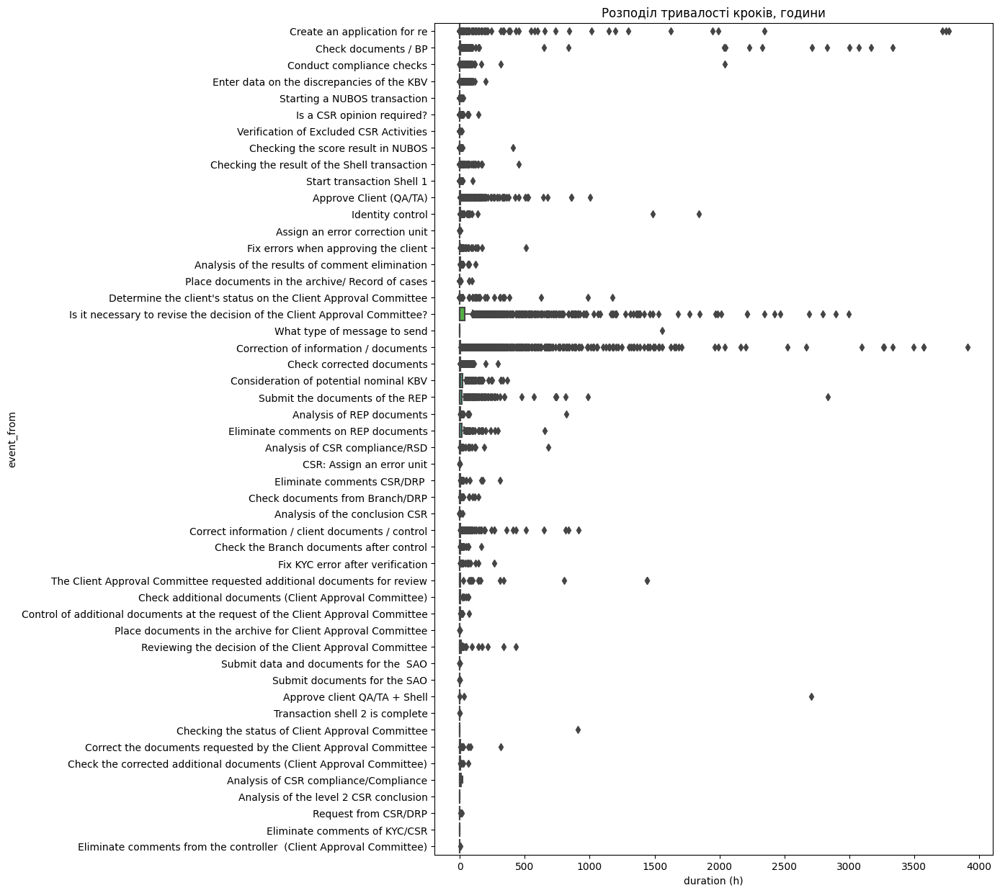

In [15]:
#візуалізуємо розподілення тривалості кроків
plt.figure(figsize=(10, 15))
sns.boxplot(x="duration (h)", y="event_from",data=duration_df).set_title("Розподіл тривалості кроків, години");

**На основі даного розподілення можемо зробити висновок, що аналізуємий процес має достатньо високі викиди у даних (до 4 тис год). 
Також візуально спостерігаємо чотири кроки з найбільшою концентрацією викидів.**

**Це може свідчити про наявність "вузьких місць" в цих кроках**

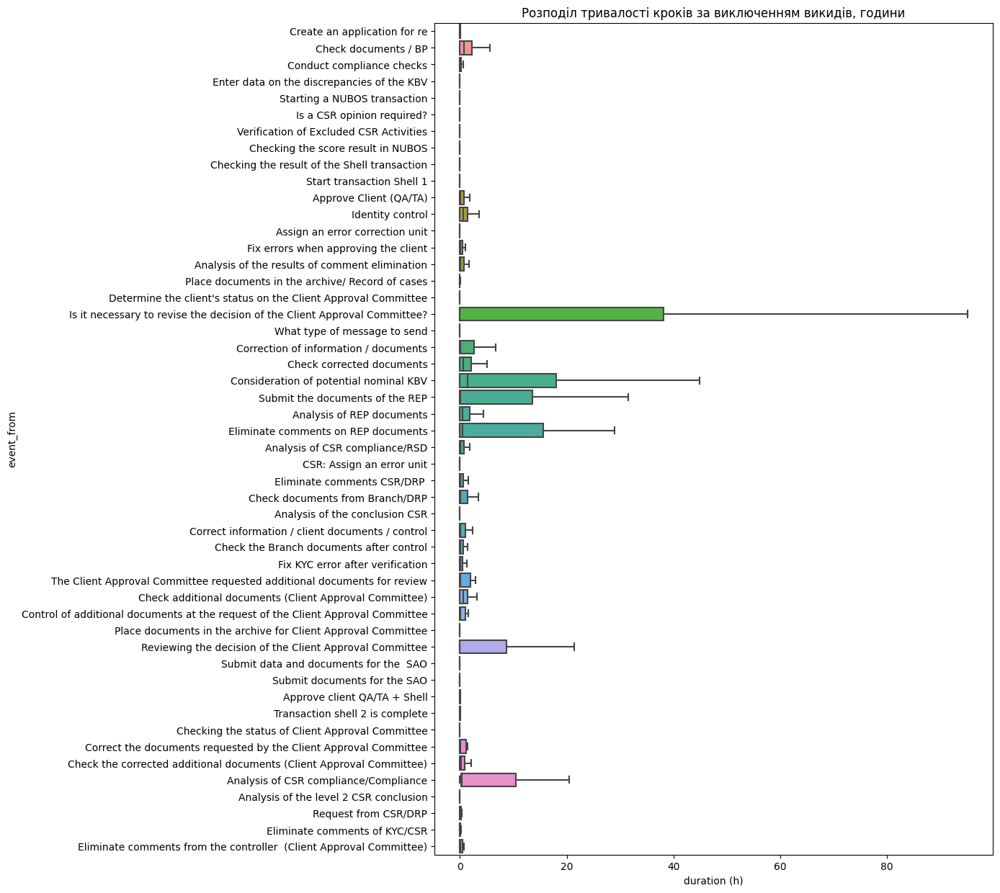

In [16]:
#візуалізуємо розподілення тривалості кроків за виключенням викидів
plt.figure(figsize=(10, 15))
sns.boxplot(x="duration (h)", y="event_from",data=duration_df, showfliers=False).set_title("Розподіл тривалості кроків за виключенням викидів, години");

In [17]:
#розрахуємо IQR (Inter Quartile range) і проаналізуємо розподілення середнього значення тривалості кроків
Q1 = duration_df['duration (h)'].quantile(0.25)
Q3 = duration_df['duration (h)'].quantile(0.75)
IQR = Q3 - Q1
Min_value = (Q1 - 1.5 * IQR).round(2)
Max_value = (Q3 + 1.5 * IQR).round(2)
print("Мінімальне значення, до якого існують викиди: {}".format(Min_value))
print("Максимальне значення, після якого існують викиди: {}".format(Max_value))

Мінімальне значення, до якого існують викиди: -0.03
Максимальне значення, після якого існують викиди: 0.05


In [18]:
duration_df['duration (h)'].describe(percentiles = [0.75,0.9,0.99])

count    203797.000000
mean          4.647196
std          56.891939
min           0.000000
50%           0.000000
75%           0.020833
90%           1.428889
99%          73.887122
max        3912.539167
Name: duration (h), dtype: float64

**Спостереження:**
- Отже, в середньому по процесу, 75% кроків тривають до 0.02 год ( 1.3 хв )
- При цьому середній показник дорівнює 4.65 год, що свідчить про наявність великих викидів в даних і асиметричний розподіл

In [19]:
#проаналізуємо розподілення кроків по тривалості часу
def dist_box(dataset, column):
    with warnings.catch_warnings():
      warnings.simplefilter("ignore")

      plt.figure(figsize=(16,6))

      plt.subplot(1,2,1)
      sns.distplot(dataset[column], color = 'purple')
      pltname = 'Графік розподілу для ' + column
      plt.ticklabel_format(style='plain', axis='x')
      plt.title(pltname)

      plt.subplot(1,2,2)
      red_diamond = dict(markerfacecolor='r', marker='D')
      sns.boxplot(y = column, data = dataset, flierprops = red_diamond)
      pltname = 'Боксплот для ' + column
      plt.title(pltname)

      plt.show()

def outliers_analysis(df, column):
  display(df[column].describe(percentiles = [0.75,0.99,0.9999]))
  dist_box(df, column)

count     203797.000000
mean           4.647196
std           56.891939
min            0.000000
50%            0.000000
75%            0.020833
99%           73.887122
99.99%      2711.827637
max         3912.539167
Name: duration (h), dtype: float64

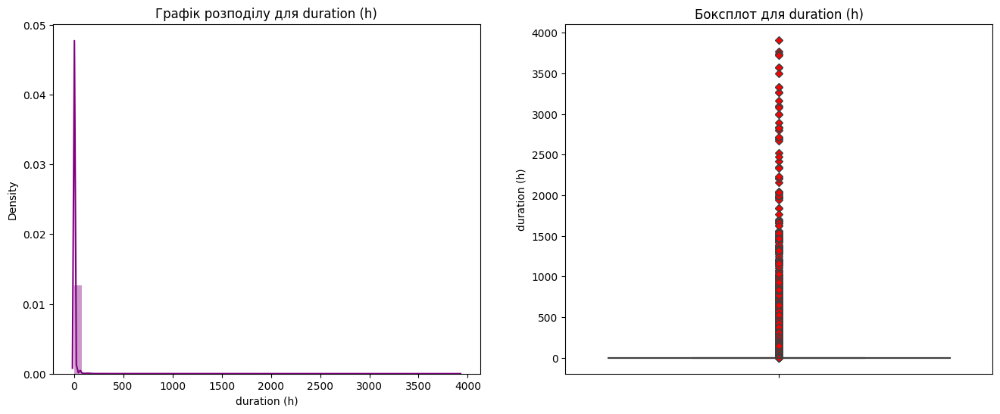

In [20]:
outliers_analysis(duration_df, 'duration (h)')

**Для подальшого аналізу процесу нас будуть цікавити кроки:**
- що мають високий показник викидів (емпірично для першої ітерації візьмемо кроки, що мають тривалість більше 99%-го персентиля - 74 год)
- у яких Max_value більше 0.052 год

In [21]:
max_duration = duration_df[duration_df['duration (h)'] >= 74]

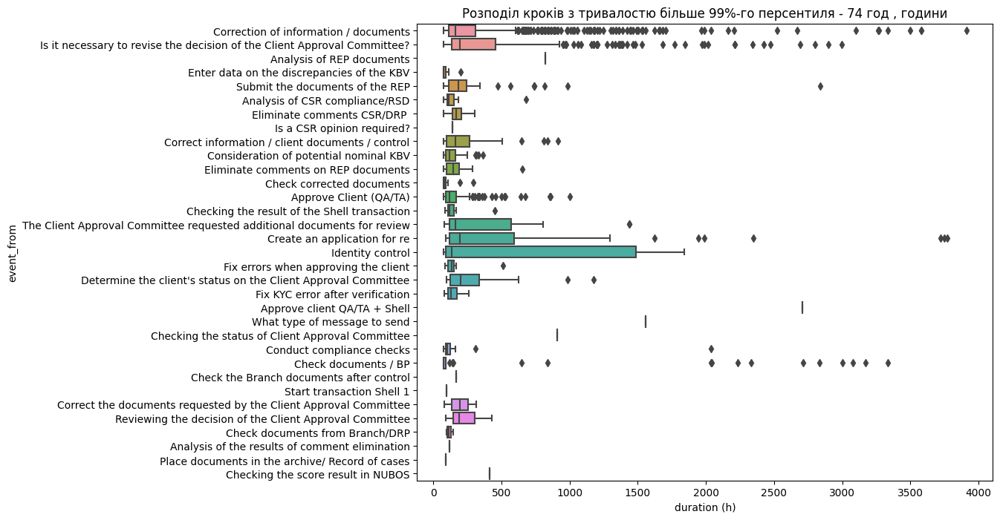

In [22]:
#візуалізуємо розподілення тривалості кроків
plt.figure(figsize=(10, 8))
sns.boxplot(x="duration (h)", y="event_from",data=max_duration).set_title("Розподіл кроків з тривалостю більше 99%-го персентиля - 74 год , години");

На основі отриманого аналізу можемо виділити чотири кроки, що мають найбільше значення і найбільшу кіл-ть викидів:
- 'Correction of information / documents'
- 'Is it necessary to revise the decision of the Client Approval Committee?'
- 'Create an application for re'
- 'Check documents / BP'

Ці кроки ми візьмемо в першу чергу в подальше детальне пропрацювання і пошук причинно-наслідкових зв"язків.

В другу чергу необхідно звернути увагу на кроки, що мають високий показник тривалості, це також може свідчити про неоптимальність процесу чи велику кіл-ть ручних операцій:
- 'Identity control'
- 'Create an application for re'
- 'The Client Approval Committee requested additional documents for review'

**Наступним кроком проаналізуємо статуси з якими завершилися запити і на якому кроці це сталося**

In [23]:
#Готуємо зведено таблицю по результатам завершення запитів

# Групуємо дані за CASE_ID і знаходимо максимальний час (час завершення)
last_events = df.groupby('CASE_ID')['STEP_START'].max().reset_index(name='end_time')

# Об'єднуємо з вихідними даними
data = pd.merge(df, last_events, on='CASE_ID')

# Обчислюємо тривалість процесу
data['duration'] = (data['end_time'] - data['STEP_START']).dt.total_seconds() / 3600

# Групуємо дані за PROCESS_STATUS_IND, підраховуємо кількість кроків та середню тривалість
result = data.groupby([ 'PROCESS_STATUS_IND']).agg({'CASE_ID':'nunique', 'STEP_NAME_EN': 'count', 'duration': 'mean'}).reset_index()

# Перейменуємо колонки для кращої читабельності
result.columns = [ 'Результат з яким завершився запит', 'Кіл-ть унікальних запитів', 'Кіл-ть кроків',  'Середня тривалість кроку, год']

# Обчислюємо загальну кількість процесів
total_cases = result['Кіл-ть унікальних запитів'].sum()

# Обчислюємо відсоток для кожного статусу
result['Відсоток завершених задач, %'] = ((result['Кіл-ть унікальних запитів'] / total_cases) * 100).round(1)
result['Середня кіл-ть кроків в одному запиті'] = (result['Кіл-ть кроків'] / result['Кіл-ть унікальних запитів']).round()

# Сортуємо таблицю за спаданням кількості унікальних кейсів
result = result.sort_values('Кіл-ть унікальних запитів', ascending=False)

result

,Результат з яким завершився запит,Кіл-ть унікальних запитів,Кіл-ть кроків,"Середня тривалість кроку, год","Відсоток завершених задач, %",Середня кіл-ть кроків в одному запиті
2,Завершений успішно,3767,205380,113.254378,97.4,55.0
0,Анульовано,56,402,1268.720265,1.4,7.0
1,Відмова,43,1881,1144.923400,1.1,44.0


Як результат бачимо, що 97,4% запитів завершуються успішно.

Запити, що завершуються неспішно мають аномально високі терміни тривалості (більше 1 тис год).

Також спостерігаємо, що запити завершені Відмовою мають кіл-ть кроків близьку до успішнозавершених запитів.

In [24]:
#Готуємо зведену таблицю по крокам, що найчастіше повторюються у процесі

# Групуємо дані за STEP_NAME_EN та CASE_ID, підраховуємо кількість повторів кожного кроку в кожному процесі
step_counts = df.groupby(['STEP_NAME', 'CASE_ID']).size().reset_index(name='count')

# Групуємо результати за STEP_NAME_EN та обчислюємо середню кількість повторів
step_avg_count = step_counts.groupby('STEP_NAME').agg({'count': 'mean'}).reset_index()
step_avg_count = step_avg_count.sort_values('count', ascending=False)

# Перейменуємо колонки для кращої читабельності
step_avg_count.columns = [ 'Назва кроку', 'Середня кіл-ть повторів кроку в одному запиті']

step_avg_count.head(10)

,Назва кроку,Середня кіл-ть повторів кроку в одному запиті
39,Request from CSR/DRP,18.000000
47,Transaction shell 2 is complete,7.500000
7,Approve client QA/TA + Shell,7.500000
15,Check the corrected additional documents (Clie...,5.400000
24,Correction of information / documents,5.155440
11,Check corrected documents,5.100654
23,Correct the documents requested by the Client ...,4.800000
14,Check the Branch documents after control,4.624204
22,Correct information / client documents / control,4.566879
30,Eliminate comments on REP documents,3.980769


Спостерігаємо тенденцію, що більшість кроків, які мають повтори в рамках одного процесу відносяться до корегування чи перевірки документів

In [25]:
#Аналізуємо кроки на яких найчастіше неуспішно завершуються запити

# Фільтруємо дані за статусами "Анульовано" або "Відмова"
failed_cases = df[df['PROCESS_STATUS_IND'].isin(['Анульовано', 'Відмова'])]

# Групуємо за CASE_ID і знаходимо останній крок в кожній групі
last_steps = failed_cases.groupby('CASE_ID').last()

# Групуємо за STEP_NAME і підраховуємо кількість випадків
last_step_counts = last_steps.groupby('STEP_NAME').size().reset_index(name='count')

# Сортуємо за спаданням кількості випадків
last_step_counts = last_step_counts.sort_values('count', ascending=False)

# Перейменуємо колонки для кращої читабельності
last_step_counts.columns = [ 'Назва кроку', 'Кіл-ть запитів завершених на цьому кроці']

last_step_counts

,Назва кроку,Кіл-ть запитів завершених на цьому кроці
2,Check documents / BP,29
5,What type of message to send,26
3,Correction of information / documents,23
4,Create an application for re,14
1,Check corrected documents,6
0,Analysis of REP documents,1


Проаналізувавши кроки на яких неуспішно завершуються запити, можемо побачити що тут так само фігурують кроки пов’язані з перевіркою і корегуванням документів

**На основі проведених вище досліджень, робимо висновок, що найбільш "вузькими" кроками процесу ресертифікація юридичних осіб є:**

- 'Correction of information / documents'
- 'Create an application for re'
- 'Check documents / BP'

Їх ми далі будемо досліджувати детально для формування рекомендацій щодо покращення

## 2.2. Візуалізуємо процес "Ресертифікація юридичних осіб"

Візуалізувати процес ми будемо за допомогою бібліотеки `pm4py` як Мережі Петрі

In [26]:
#трансформуємо дані у формат бібліотеки pm4py
event_log = pm4py.format_dataframe(
    df,
    case_id = 'CASE_ID',
    activity_key = 'STEP_NAME',
    timestamp_key = 'STEP_START'\
)

In [27]:
xes_exporter.apply(event_log, 'log.xes')

c:\users\анна\appdata\local\programs\python\python39\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
exporting log, completed traces :: 100%|██████████████████████████████████████████| 3866/3866 [00:12<00:00, 308.50it/s]


In [28]:
log = xes_importer.apply('log.xes')

c:\users\анна\appdata\local\programs\python\python39\lib\site-packages\pm4py\util\dt_parsing\parser.py:77: UserWarning: ISO8601 strings are not fully supported with strpfromiso for Python versions below 3.11
  warnings.warn(
parsing log, completed traces :: 100%|████████████████████████████████████████████| 3866/3866 [00:14<00:00, 260.65it/s]


### Мережі Петрі ("Petri Net")

**Продуктивність**

На даній схемі ми маємо можливість проаналізувати послідовність кроків процесу і час, що витрачений на цей крок

replaying log with TBR, completed traces :: 100%|████████████████████████████████████| 412/412 [00:06<00:00, 67.90it/s]


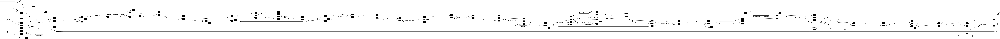

''

In [29]:
# Miner
petri_net, initial_marking, final_marking = heuristics_miner.apply(log)

# GraphViz
gviz = pn_visualizer.apply(petri_net, initial_marking, final_marking,
                           variant=pn_visualizer.Variants.PERFORMANCE, 
                           log=log)

# View
pn_visualizer.view(gviz)

# Save
pn_visualizer.save(gviz, 'petri_net_PERFORMANCE.png')

**Частота**

На даній схемі ми маємо змогу проаналізувати частоту проходження кожного кроку

replaying log with TBR, completed traces :: 100%|████████████████████████████████████| 412/412 [00:06<00:00, 61.92it/s]


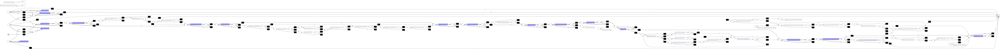

''

In [30]:
# Miner
petri_net, initial_marking, final_marking = heuristics_miner.apply(log)

# GraphViz
gviz = pn_visualizer.apply(petri_net, initial_marking, final_marking,
                           variant=pn_visualizer.Variants.FREQUENCY, 
                           log=log)

# View
pn_visualizer.view(gviz)

# Save
pn_visualizer.save(gviz, 'petri_net_FREQUENCY.png')

**Процеси, що завершилися неуспішно (в розрізі продуктивності)**

c:\users\анна\appdata\local\programs\python\python39\lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]
replaying log with TBR, completed traces :: 100%|████████████████████████████████████| 412/412 [00:05<00:00, 72.29it/s]


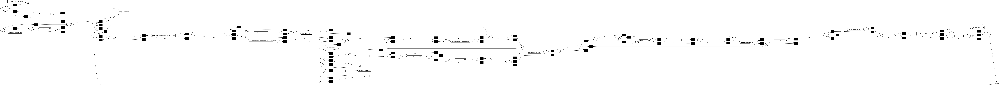

''

In [31]:
# Фільтрація логу
failed_cases = event_log[event_log['PROCESS_STATUS_IND'] == 'Відмова']

# Побудова моделі процесу для невдалих кейсів
failed_petri_net, failed_initial_marking, failed_final_marking = heuristics_miner.apply(failed_cases)

# Візуалізація моделі процесу для невдалих кейсів
failed_gviz = pn_visualizer.apply(failed_petri_net, failed_initial_marking, failed_final_marking,
                           variant=pn_visualizer.Variants.PERFORMANCE, 
                           log=log)
pn_visualizer.view(failed_gviz)

# Save
pn_visualizer.save(failed_gviz, 'petri_net_denial.png')


c:\users\анна\appdata\local\programs\python\python39\lib\site-packages\pm4py\algo\discovery\dfg\adapters\pandas\df_statistics.py:73: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[start_timestamp_key] = df[timestamp_key]
replaying log with TBR, completed traces :: 100%|███████████████████████████████████| 412/412 [00:03<00:00, 107.54it/s]


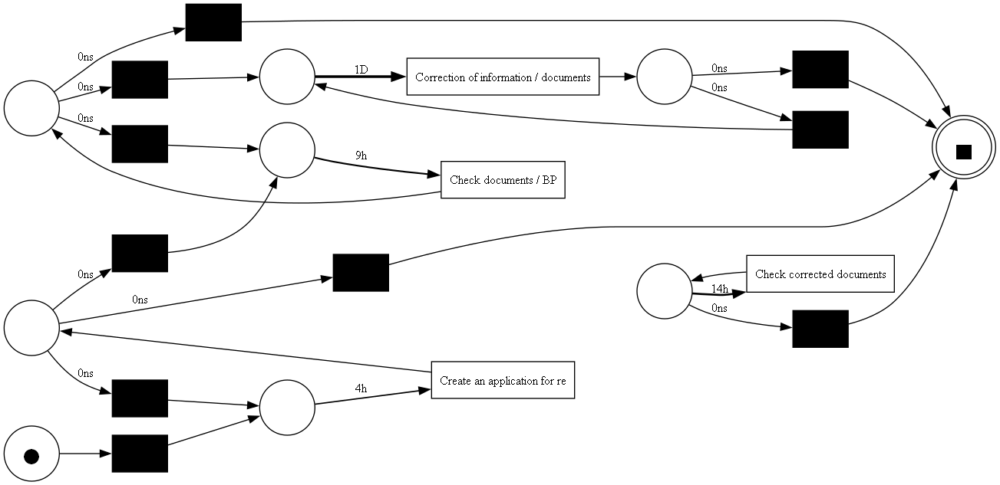

''

In [32]:
# Фільтрація логу
failed_cases = event_log[event_log['PROCESS_STATUS_IND'] == 'Анульовано']

# Побудова моделі процесу для невдалих кейсів
failed_petri_net, failed_initial_marking, failed_final_marking = heuristics_miner.apply(failed_cases)

# Візуалізація моделі процесу для невдалих кейсів
failed_gviz = pn_visualizer.apply(failed_petri_net, failed_initial_marking, failed_final_marking,
                           variant=pn_visualizer.Variants.PERFORMANCE, 
                           log=log)
pn_visualizer.view(failed_gviz)

# Save
pn_visualizer.save(failed_gviz, 'petri_net_Cancelled.png')

# 3. Аналіз результатів і рекомендації щодо покращення процесу

При аналізі на попередніх кроках ми визначили кроки, які необхідно оптимізувати в першу чергу. Це кроки, які тривають довше всього, містять великі вики в даних, часто повторюються в рамках одного процесу і є фінальними в запитах, що завершилися неуспішно:
- 'Correction of information / documents'
- 'Create an application for re'
- 'Check documents / BP'

В даній частині роботи ми проаналізуємо фактори впливу на ці кроки і сформуємо рекомендації щодо їх покращення.

In [33]:
#підготуємо дані для аналізу
duration_df_2 = activity_duration(df, 'CASE_ID', 'STEP_NAME_EN', 'STEP_START')\
.loc[:, ['event_from', 'event_to', 'duration (h)']]
# Перейменуємо колонки для кращої читабельності
duration_df_2.columns = [ 'STEP_NAME_EN', 'STEP_NAME_EN_2', 'Duration (h)']

# Об'єднання датафреймів за стовпцями 'CASE_ID' та 'STEP_NAME_EN'
merged_df = pd.merge(duration_df_2, df, on=['CASE_ID', 'STEP_NAME_EN'], how='outer')

final = merged_df[['STEP_NAME', 'STEP_TYPE', 'STAGE', 'Duration (h)']]

In [34]:
def bi_cat_countplot(df, column, hue_column):
    unique_hue_values = df[hue_column].unique()
    fig, axes = plt.subplots(nrows=1, ncols=2)
    fig.set_size_inches(14,6)

    pltname = f'Нормалізований розподіл значень за категорією: {column}'
    proportions = df.groupby(hue_column)[column].value_counts(normalize=True)
    proportions = (proportions*100).round(2)
    ax = proportions.unstack(hue_column).sort_values(
        by=unique_hue_values[0], ascending=False
        ).plot.bar(ax=axes[0], title=pltname)

    # анотація значень в барплоті
    for container in ax.containers:
        ax.bar_label(container, fmt='{:,.1f}%')

    pltname = f'Кількість даних за категорією: {column}'
    counts = df.groupby(hue_column)[column].value_counts()
    ax = counts.unstack(hue_column).sort_values(
        by=unique_hue_values[0], ascending=False
        ).plot.bar(ax=axes[1], title=pltname)

    for container in ax.containers:
      ax.bar_label(container)


def uni_cat_target_compare(df, column, hue_column):
    bi_cat_countplot(df, column, hue_column=hue_column)

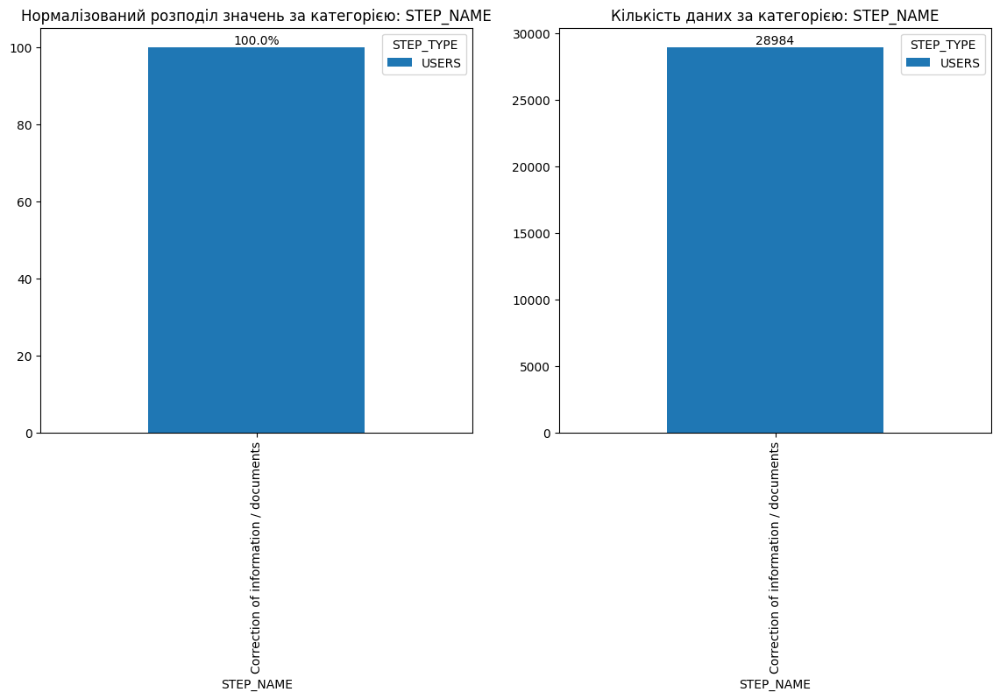

In [35]:
final_filtered_1 = final[final['STEP_NAME'] == 'Correction of information / documents']
uni_cat_target_compare(final_filtered_1, 'STEP_NAME', 'STEP_TYPE')

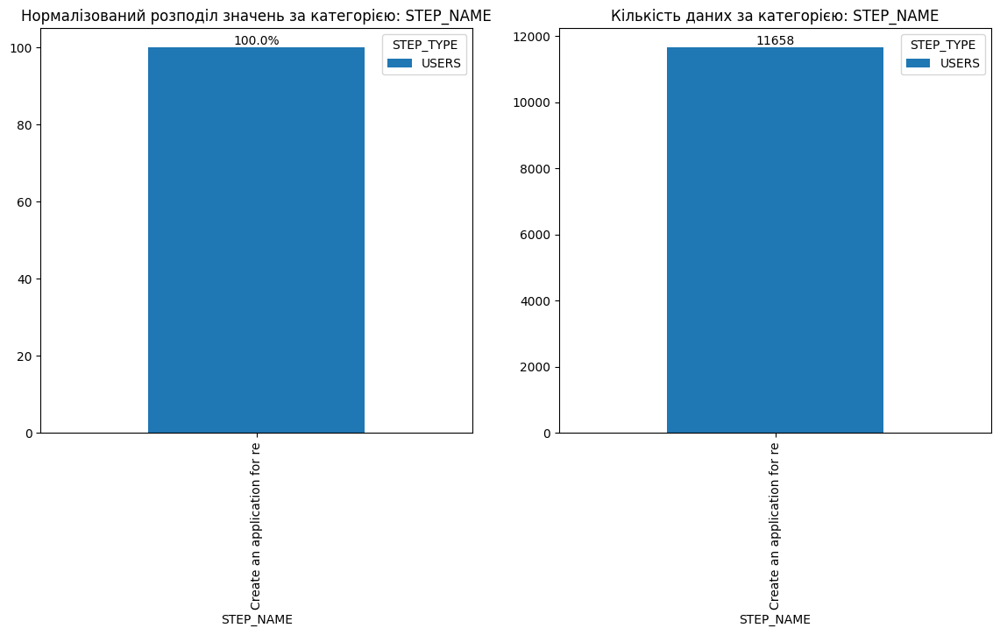

In [36]:
final_filtered_2 = final[final['STEP_NAME'] == 'Create an application for re']
uni_cat_target_compare(final_filtered_2, 'STEP_NAME', 'STEP_TYPE')

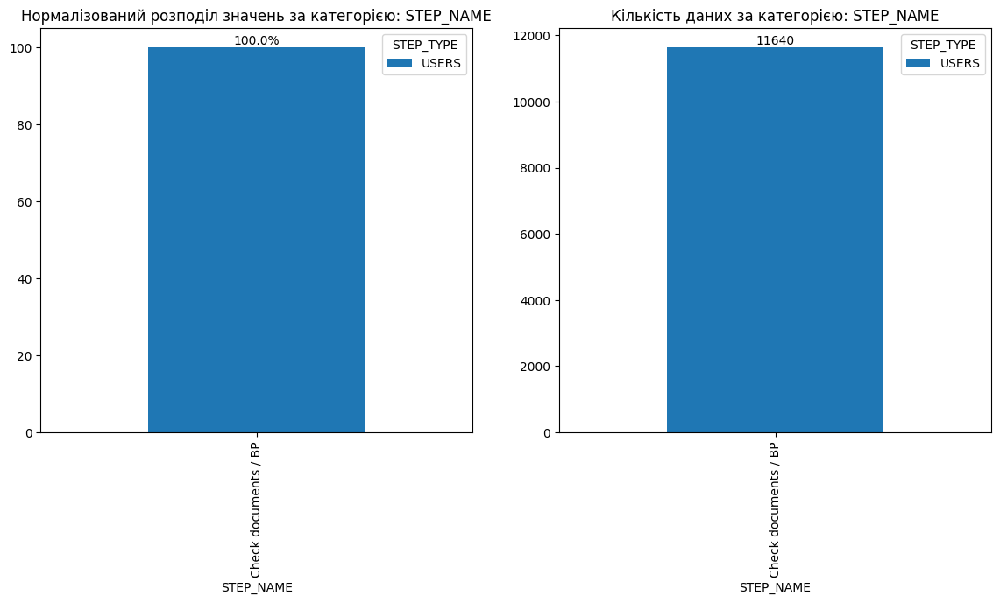

In [37]:
final_filtered_3 = final[final['STEP_NAME'] == 'Check documents / BP']
uni_cat_target_compare(final_filtered_3, 'STEP_NAME', 'STEP_TYPE')

Із проведених вище розподілів ми бачимо, що у всіх кроках, що потребують оптимізації, автором є користувач (`USERS`). Можемо припустити, що користувачам складно виконувати певний крок процесу, або вони не мають достатньо інформації щодо його реалізації.

Розглянемо ще детально в якому статісу найбільш тривалий час знаходяться кроки

In [38]:
fig = px.histogram(final_filtered_1,
                   x='Duration (h)',
                   marginal='box',
                   color='STAGE',
                   color_discrete_sequence=['green', 'blue', 'orange'],
                   title='Розподіл тривалості кроку Correction of information / documents по статусу (,tp')
fig.update_layout(bargap=0.1)
fig.show()

З отриманого результату бачимо, що по кроку Correction of information / documents найбільше аномалій (викидів) ми спостурігаємо на кроці очікування (WAITING) це може свідчити про те, що користувачі шукають необхідну інформацію для корегування.

Зробимо ще одне дослідження без урахування викидів:

In [39]:
#формуємо вибірку даних
final_filtered_1_ = final_filtered_1[final_filtered_1['Duration (h)'] >= 74]

fig = px.histogram(final_filtered_1_,
                   x='Duration (h)',
                   marginal='box',
                   color='STAGE',
                   color_discrete_sequence=['green', 'blue', 'orange'],
                   title='Розподіл тривалості кроку Correction of information / documents по статусу (без урахування викидів)')
fig.update_layout(bargap=0.1)
fig.show()

Для вибірки очтщенної від викидів ми бачимо, що статус очікування (WAITING) і виконання (EXECUTION) переважають у своїй тривалості

Саме тому, **на основі проведеного аналізу для кроку `Correction of information / documents по статусу` є рекомендація проаналізувати дані, які має користувач для корегування інформації чи документів (опис, повнота, доступність), а також проаналізувати інструменти за допомогою яких користувачі виконують цей крок (створення шаблонів і перевірки коректності заповнення полів)**

In [40]:
fig = px.histogram(final_filtered_2,
                   x='Duration (h)',
                   marginal='box',
                   color='STAGE',
                   color_discrete_sequence=['green', 'blue', 'orange'],
                   title='Розподіл тривалості кроку Create an application for re')
fig.update_layout(bargap=0.1)
fig.show()

З отриманого результату бачимо, що по кроку Create an application for re найбільше аномалій (викидів) ми спостурігаємо на кроці виконання (EXECUTION) це може свідчити про те, що "підвисає" програма чи довго обробляється аплікаційна форма.

Зробимо ще одне дослідження без урахування викидів:

In [41]:
#формуємо вибірку даних
final_filtered_2_ = final_filtered_2[final_filtered_2['Duration (h)'] >= 74]

fig = px.histogram(final_filtered_2_,
                   x='Duration (h)',
                   marginal='box',
                   color='STAGE',
                   color_discrete_sequence=['green', 'blue', 'orange'],
                   title='Розподіл тривалості кроку Create an application for re по статусу (без урахування викидів)')
fig.update_layout(bargap=0.1)
fig.show()

Без урахування викидів ми фіксуємо відсутність статусу Створення (CREATION), також мінімальний час очікування (WAITING). Вся основна концентрація в виконанні (EXECUTION).

Саме тому, **на основі проведеного аналізу для кроку `Create an application for re` є рекомендація проаналізувати швидкодію системи при обробці інформації від користувача (обов"язкові перевірики, валідація коректності заповнення даних тощо)**

In [42]:
fig = px.histogram(final_filtered_3,
                   x='Duration (h)',
                   marginal='box',
                   color='STAGE',
                   color_discrete_sequence=['green', 'blue', 'orange'],
                   title='Розподіл тривалості кроку Check documents / BP')
fig.update_layout(bargap=0.1)
fig.show()

З отриманого результату бачимо, що по кроку Check documents / BP найбільше аномалій (викидів) ми спостурігаємо на кроці очікування (WAITING) це може свідчити про те, що або тривалий час займає перевірка документів (відсутні правила і регламенти), або відсутня чи не налагоджена система сповіщення про необхідність перевірки.

Зробимо ще одне дослідження без урахування викидів:

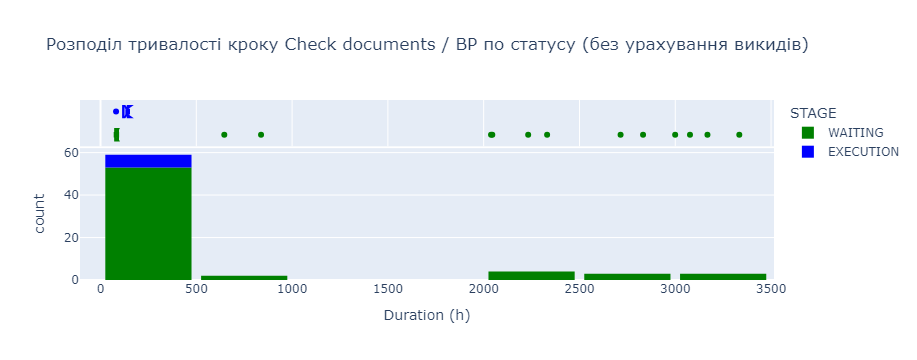

In [43]:
#формуємо вибірку даних
final_filtered_3_ = final_filtered_3[final_filtered_3['Duration (h)'] >= 74]

fig = px.histogram(final_filtered_3_,
                   x='Duration (h)',
                   marginal='box',
                   color='STAGE',
                   color_discrete_sequence=['green', 'blue', 'orange'],
                   title='Розподіл тривалості кроку Check documents / BP по статусу (без урахування викидів)')
fig.update_layout(bargap=0.1)
fig.show()

Без урахування викидів ми фіксуємо відсутність статусу Створення (CREATION), також мінімальний час виконанні (EXECUTION). Вся основна концентрація в очікування (WAITING).

Саме тому, **на основі проведеного аналізу для кроку `Check documents / BP` є рекомендація проаналізувати сповіщення про необхідність перевірки документів (повідомлення, лист на ел.пошту тощо), а також проаналізувати регламент перевірки (чи є маркери, що необхідно перевірити, чи як виправити)**